##**Notebook PC#08** -- Unempolyment rate dataset
## Simple Recurrent Neural Network, Linear Predictor, MLP and LSTM for multi-step time series prediction.<BR>

**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Gabriel Toffanetto França da Rocha - 289320<br>
**Aluno(a):** Maria Fernanda Paulino Gomes - 206745<br>


In [28]:
# Loading all the relevant libraries
from google.colab import drive
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

## **A base [unemployment rate] foi baixada no [link](https://fred.stlouisfed.org/series/UNRATE).**

In [29]:
# Montar o Google Drive
drive.mount('/content/drive')

# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
      df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
      df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    print(df)
    df1 = df.copy()
    for i in range(1,horizon+1):
      df1 = df1.drop(['t+' + str(i)], axis = 1)
    dataX = np.array(df1) #separacao de dados de time_steps
    df2 = df['t+1']
    for i in range(2,horizon+1):
      df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2) #separacao de dados de horizon
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Defina o caminho para o arquivo no Google Drive (certifique-se de que o arquivo foi movido para "Meu Drive")
file_path = '/content/drive/My Drive/Colab Notebooks/PC06-12/unemployment_rate.csv'
# Here you will decide which dataset to consider.
# X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, time_steps, horizon)
X, y, Xt, yt = get_train_test(file_path, 0.8, time_steps, horizon)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073171  0.105691  0.121951  0.113821  0.081301  0.089431  0.089431   
1    0.105691  0.121951  0.113821  0.081301  0.089431  0.089431  0.113821   
2    0.121951  0.113821  0.081301  0.089431  0.089431  0.113821  0.105691   
3    0.113821  0.081301  0.089431  0.089431  0.113821  0.105691  0.097561   
4    0.081301  0.089431  0.089431  0.113821  0.105691  0.097561  0.105691   
..        ...       ...       ...       ...       ...       ...       ...   
897  0.089431  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171   
898  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561   
899  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431   
900  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301   
901  0.089431  0.081301 

In [30]:
print(X.shape)
print(y.shape)

(732, 11)
(732, 3)


## **Implementing the simple recurrent neural network**

In [31]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def create_RNN(hidden_units, dense_units, input_shape, activation):
        model = Sequential()
        model.add(SimpleRNN(hidden_units, activation=activation[0], input_shape=input_shape))
        model.add(Dense(units=dense_units, activation=activation[1]))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

def RNN_predictor (X, y, time_steps):
    model = create_RNN(hidden_units=30, dense_units=horizon, input_shape=(time_steps,1), activation=['tanh', 'tanh'])
    train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
    return model

RNN_model = RNN_predictor(X, y, time_steps)

Epoch 1/20
732/732 - 3s - loss: 0.0031 - 3s/epoch - 4ms/step
Epoch 2/20
732/732 - 2s - loss: 0.0011 - 2s/epoch - 2ms/step
Epoch 3/20
732/732 - 2s - loss: 9.1538e-04 - 2s/epoch - 2ms/step
Epoch 4/20
732/732 - 3s - loss: 8.4318e-04 - 3s/epoch - 4ms/step
Epoch 5/20
732/732 - 3s - loss: 8.1577e-04 - 3s/epoch - 4ms/step
Epoch 6/20
732/732 - 2s - loss: 7.3352e-04 - 2s/epoch - 3ms/step
Epoch 7/20
732/732 - 2s - loss: 7.5693e-04 - 2s/epoch - 3ms/step
Epoch 8/20
732/732 - 2s - loss: 7.3980e-04 - 2s/epoch - 3ms/step
Epoch 9/20
732/732 - 2s - loss: 7.3717e-04 - 2s/epoch - 2ms/step
Epoch 10/20
732/732 - 2s - loss: 7.2189e-04 - 2s/epoch - 2ms/step
Epoch 11/20
732/732 - 2s - loss: 7.3621e-04 - 2s/epoch - 3ms/step
Epoch 12/20
732/732 - 3s - loss: 7.1824e-04 - 3s/epoch - 4ms/step
Epoch 13/20
732/732 - 2s - loss: 6.7814e-04 - 2s/epoch - 3ms/step
Epoch 14/20
732/732 - 2s - loss: 7.0360e-04 - 2s/epoch - 2ms/step
Epoch 15/20
732/732 - 2s - loss: 7.2912e-04 - 2s/epoch - 3ms/step
Epoch 16/20
732/732 - 2s - 

In [ ]:
# [Do not run this cell] or [Upload the PNG file and then run].
# Configuration of the simple RNN
from IPython.display import Image
Image("RNN_info_flow.png", width = 600, height = 300)

In [33]:
wx = RNN_model.get_weights()[0]
wh = RNN_model.get_weights()[1]
bh = RNN_model.get_weights()[2]
wy = RNN_model.get_weights()[3]
by = RNN_model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


## **Implementing a linear predictor**

In [34]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def linear_predictor(X,y):
    model = LinearRegression()
    train_predict = model.fit(X, y)
    print(model.coef_)
    print(model.intercept_)

    return model

linear_model = linear_predictor(X,y)

[[ 0.11851811 -0.12171889 -0.02107678  0.05709181 -0.03613607 -0.1277338
   0.03432588 -0.0803625  -0.07273654  0.2400809   0.9935694 ]
 [ 0.07581855  0.04241052 -0.134515    0.02920142  0.01571846 -0.15734799
  -0.09819799 -0.0460189  -0.15392885  0.16570777  1.2284961 ]
 [ 0.21077284 -0.12918374 -0.00265026 -0.06813775 -0.01591381 -0.13397385
  -0.10556133 -0.18870555 -0.14540194  0.13890208  1.3892753 ]]
[0.00447309 0.008991   0.01394928]


## **Implementing the multilayer perceptron neural network (MLP)**

In [35]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def MLP_predictor():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
  ])
  model.compile(optimizer='adam', loss='mean_squared_error')
  train_predict = model.fit(X, y, epochs=100)
  model.summary()

  return model

MLP_model = MLP_predictor()

Epoch 1/100
23/23 [==============================] - 1s 2ms/step - loss: 0.0476
Epoch 2/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0171
Epoch 3/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0123
Epoch 4/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0090
Epoch 5/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0080
Epoch 6/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0071
Epoch 7/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 8/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 9/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0042
Epoch 10/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 11/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0035
Epoch 12/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0033
Epoch 13/100
23/23 [=================

## **Implementing the long short-term memory network (LSTM)**

In [36]:
def LSTM_predictor(X, y, time_steps):
    X1 = X.reshape(X.shape[0],time_steps,1)
    model=Sequential()
    model.add(LSTM(25,input_shape=(time_steps,1)))
    model.add(Dense(horizon,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer='adam')

    train_predict = model.fit(X1,y,epochs=200,verbose=2)

    return model

LSTM_model = LSTM_predictor(X, y, time_steps)
print(LSTM_model.summary())

Epoch 1/200
23/23 - 4s - loss: 0.0432 - 4s/epoch - 158ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0073 - 240ms/epoch - 10ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0050 - 196ms/epoch - 9ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0043 - 146ms/epoch - 6ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0039 - 148ms/epoch - 6ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0037 - 135ms/epoch - 6ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0036 - 137ms/epoch - 6ms/step
Epoch 8/200
23/23 - 0s - loss: 0.0035 - 133ms/epoch - 6ms/step
Epoch 9/200
23/23 - 0s - loss: 0.0034 - 129ms/epoch - 6ms/step
Epoch 10/200
23/23 - 0s - loss: 0.0033 - 136ms/epoch - 6ms/step
Epoch 11/200
23/23 - 0s - loss: 0.0032 - 142ms/epoch - 6ms/step
Epoch 12/200
23/23 - 0s - loss: 0.0031 - 130ms/epoch - 6ms/step
Epoch 13/200
23/23 - 0s - loss: 0.0030 - 154ms/epoch - 7ms/step
Epoch 14/200
23/23 - 0s - loss: 0.0029 - 141ms/epoch - 6ms/step
Epoch 15/200
23/23 - 0s - loss: 0.0028 - 132ms/epoch - 6ms/step
Epoch 16/200
23/23 - 0s - loss: 0.0027 - 137ms/ep

In [37]:
def print_error(trainY, testY, train_predict, test_predict,i):
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
    test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
    # Print RMSE
    print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
    print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))
    return [train_rmse, test_rmse]


def RMSE(train_predict, test_predict):
  rmse = []
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]

    erro = print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    rmse.append(erro)

  # Create a DataFrame from the rmse values for each horizon
  df = pd.DataFrame(rmse)
  df.columns = ['train', 'test']
  return df


In [38]:
# Plot the predictions together with the actual values
def plot_result(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Time steps')
    plt.ylabel('Actual and Predicted Values')
    plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.grid(True)

def plot_predict(train_predict, test_predict, y, yt):
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result(y1, y1_t, y1_pred, y1_pred_t,i)


***** RNN MODEL *****
6/6 [==============================] - 0s 3ms/step
t+1 RMSE train: 0.018 RMSE
t+1 RMSE test: 0.068 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.094 RMSE
t+3 RMSE train: 0.032 RMSE
t+3 RMSE test: 0.113 RMSE


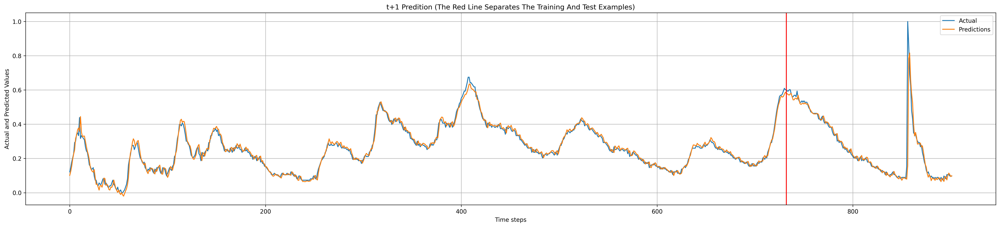

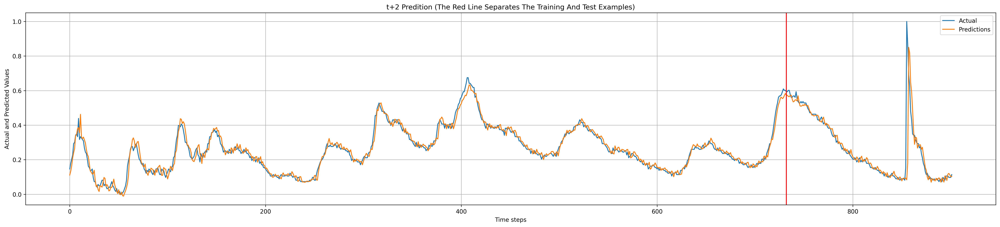

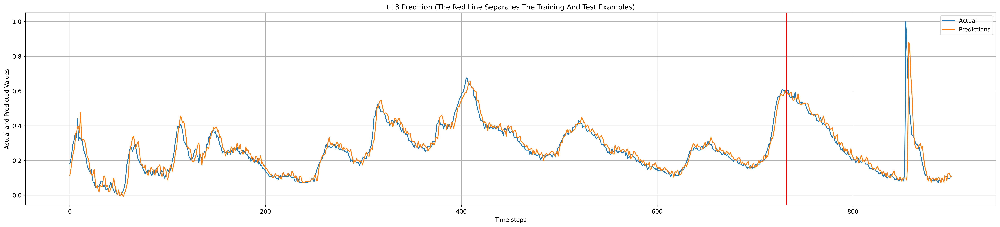

In [39]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
df1 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LINEAR MODEL *****
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.077 RMSE
t+2 RMSE train: 0.022 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.141 RMSE


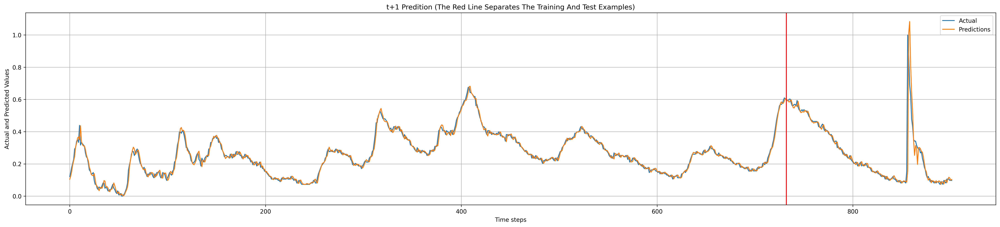

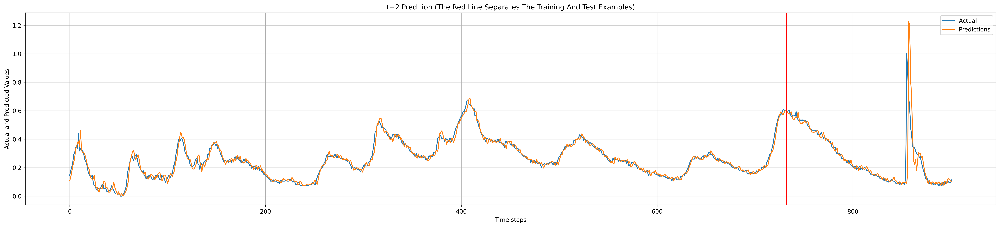

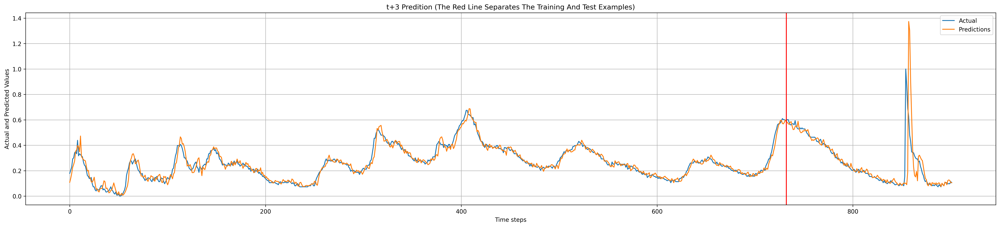

In [40]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
df2 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step
t+1 RMSE train: 0.017 RMSE
t+1 RMSE test: 0.076 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.112 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.139 RMSE


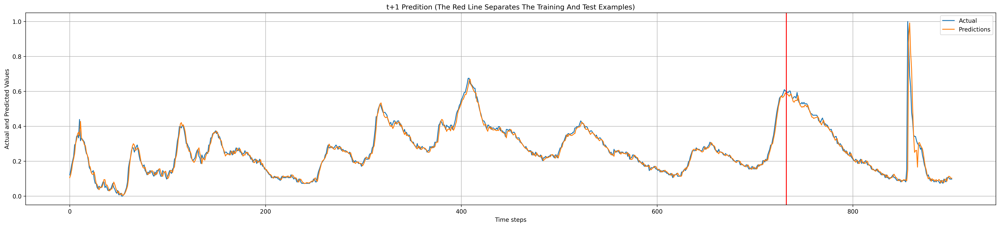

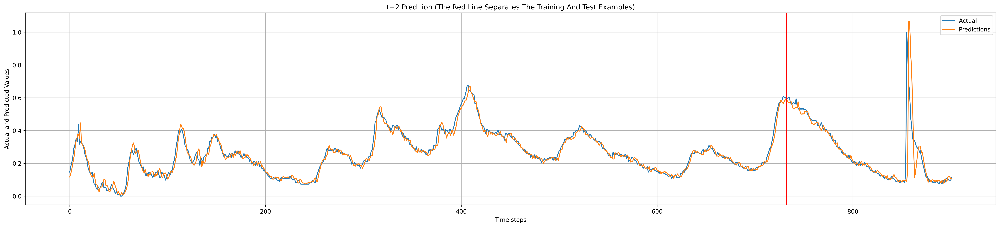

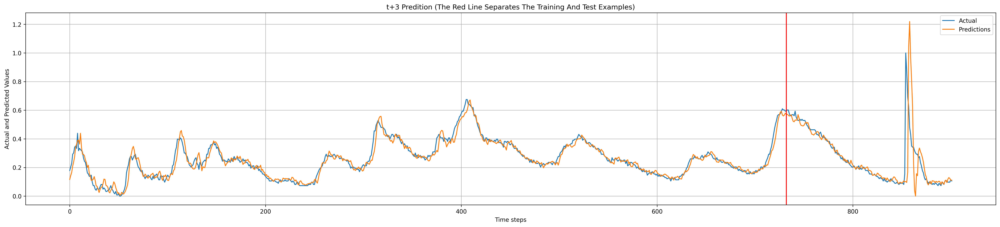

In [41]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
df3 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 3ms/step
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.079 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.113 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.139 RMSE


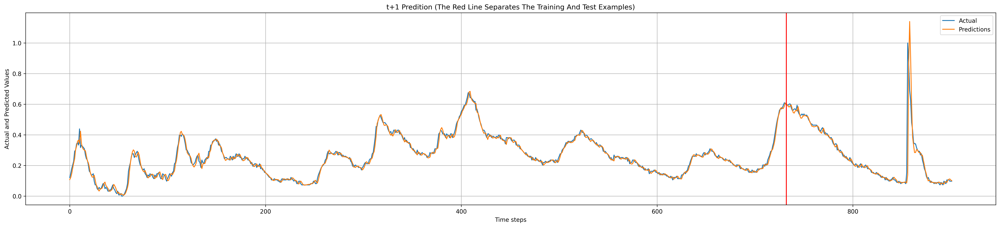

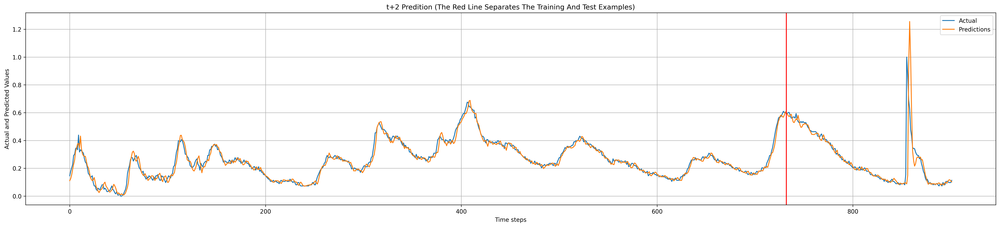

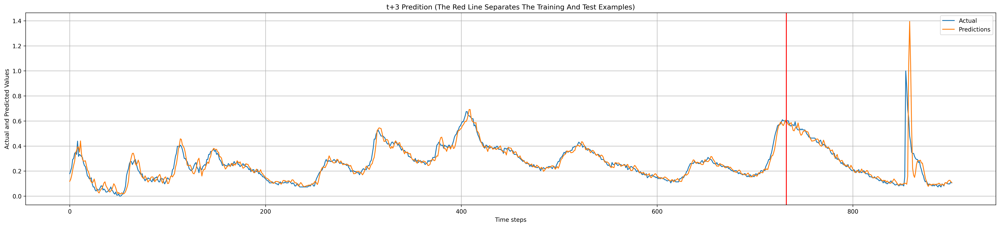

In [42]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
df4 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

In [43]:
# Plot the prediction error
def plot_result2(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual - predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.xlabel('Time steps')
    plt.ylabel('Actual minus Predicted Values')
    plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
    plt.grid(True)

def plot_error_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
      if(horizon == 1):
        y1_pred = train_predict
        y1_pred_t = test_predict
        y1 = y
        y1_t = yt
      elif(horizon > 1):
        y1_pred = train_predict[:,i]
        y1_pred_t = test_predict[:,i]
        y1 = y[:,i]
        y1_t = yt[:,i]
      plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

***** RNN MODEL *****
6/6 [==============================] - 0s 3ms/step


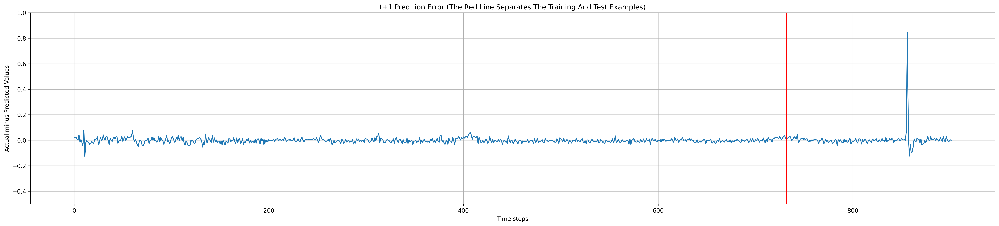

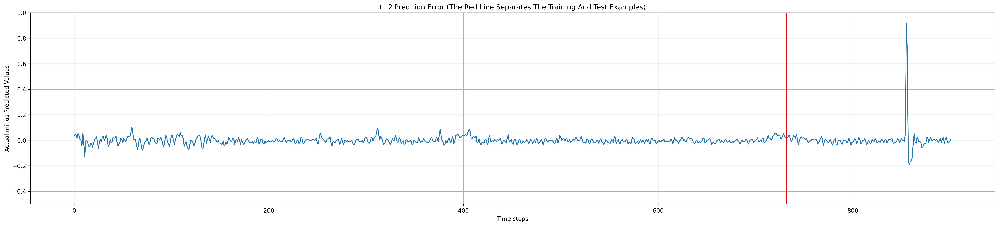

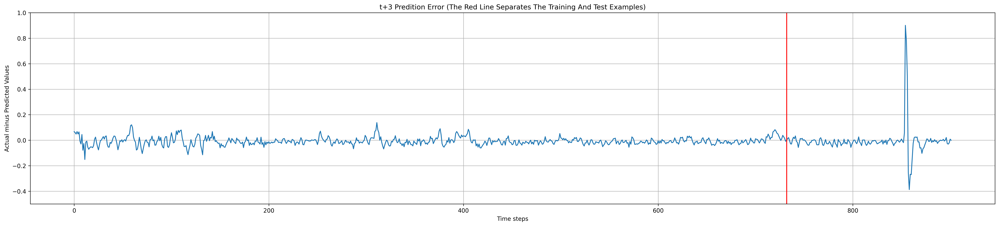

In [44]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)


***** LINEAR MODEL *****


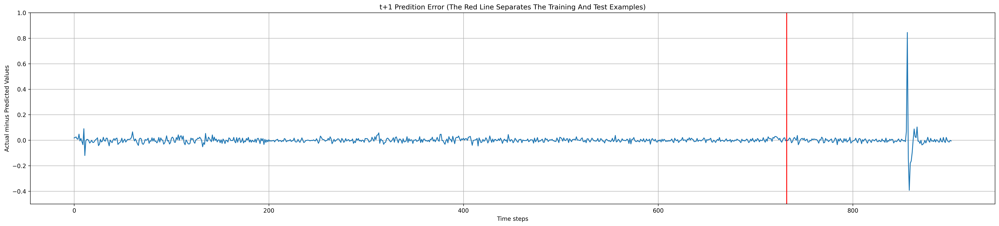

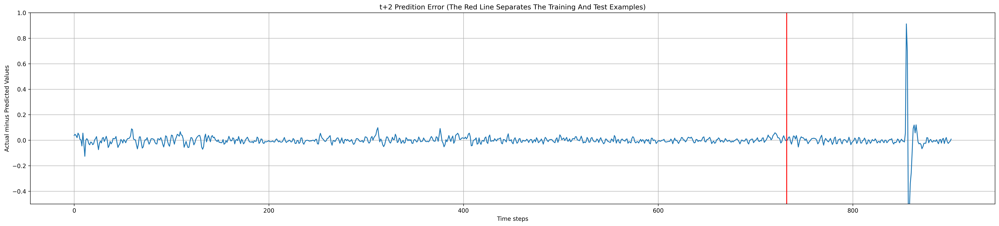

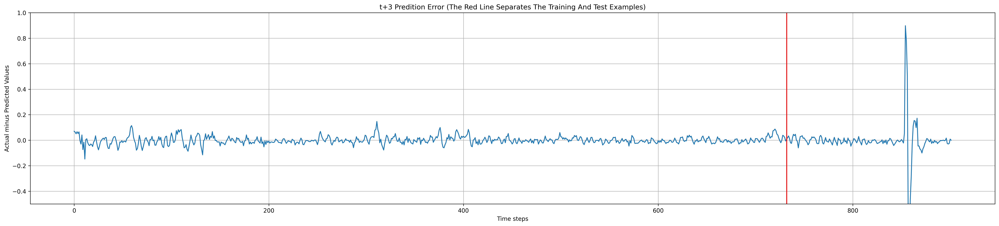

In [45]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 5ms/step


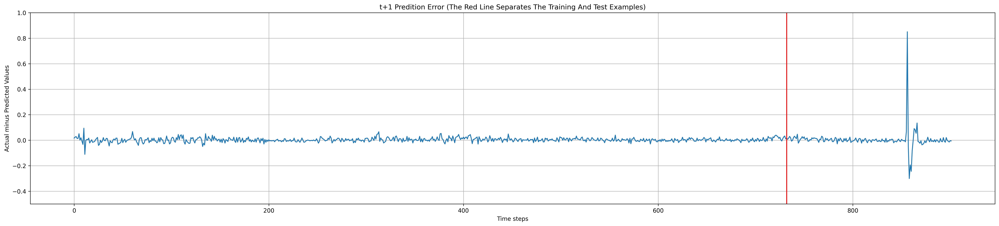

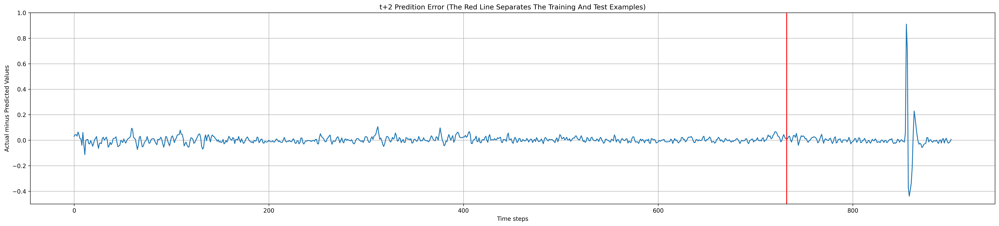

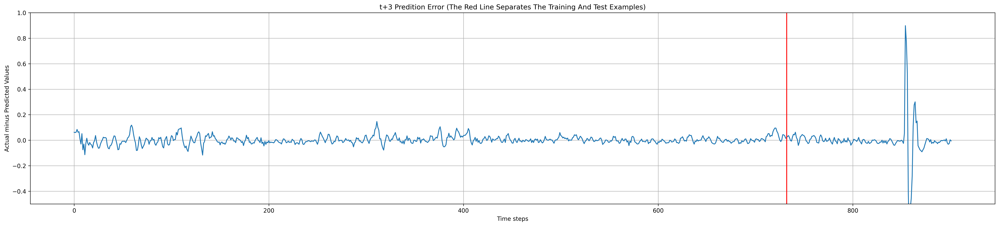

In [46]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 4ms/step


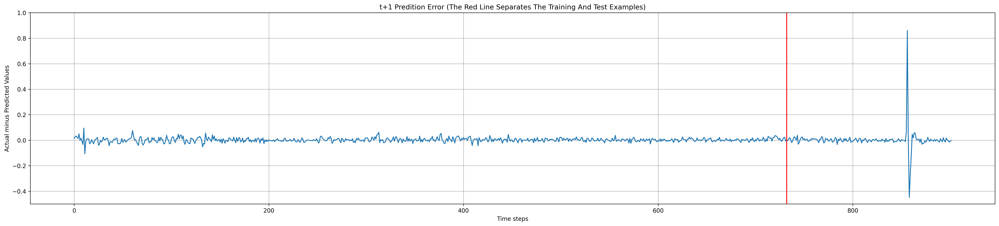

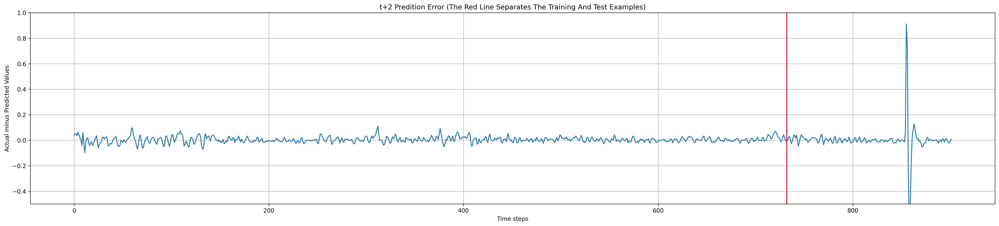

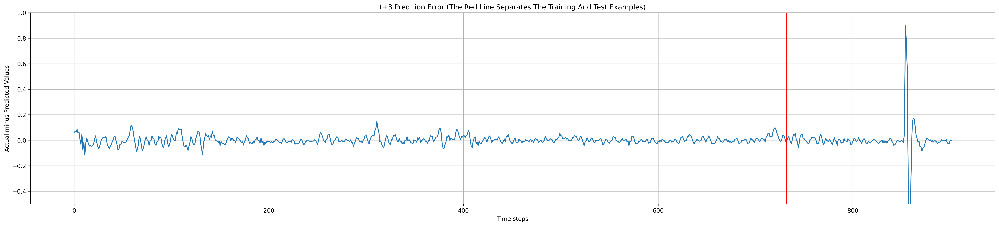

In [47]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

## **Exhibit a dataframe with the final results for each predictor**

In [48]:
DF_results = pd.concat([df1, df2, df3, df4], axis=1, keys=['RNN', 'LINEAR', 'MLP', 'LSTM'])
DF_results.index = ['t+1', 't+2', 't+3']
DF_results

RNN              LINEAR                 MLP                LSTM  \
        train      test     train      test     train      test     train   
t+1  0.017802  0.068403  0.015883  0.076998  0.016603  0.076351  0.016482   
t+2  0.023843  0.094377  0.022425  0.114303  0.023149  0.111721  0.023311   
t+3  0.031608  0.112544  0.029590  0.141454  0.030642  0.139361  0.030116   

               
         test  
t+1  0.079371  
t+2  0.113482  
t+3  0.138755

## **Use the SimpleRNN model to make a search for the best [time_steps].**

In [49]:
# Montar o Google Drive
drive.mount('/content/drive')

time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF1 = pd.DataFrame()

# Defina o caminho para o arquivo no Google Drive (certifique-se de que o arquivo foi movido para "Meu Drive")
file_path_2 = '/content/drive/My Drive/Colab Notebooks/PC06-12/unemployment_rate.csv'

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test(file_path_2, 0.8, timesteps, horizon)
    RNN_model = RNN_predictor(X, y, timesteps)
    train_predict = RNN_model.predict(X)
    test_predict = RNN_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF1 = pd.concat([DF1, rmse], axis=1)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/20
732/732 - 3s - loss: 0.0063 - 3s/epoch - 4ms/step
Epoch 2/20
732/732 - 1s - loss: 8.6955e-04 - 1s/epoch - 2ms/step
Epoch 3/20
732/732 - 1s - loss: 8.7062e-04 - 1s/epoch - 2ms/step
Epoch 4/20
732/732 - 1s - loss: 8.6959e-04 - 1s/epoch - 2ms/step
Epoch 5/20
732/732 - 1s - loss: 8.7574e-04 - 1s/epoch - 2ms/ste

In [50]:
DF1.index = ['t+1', 't+2', 't+3']
DF1

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.019341  0.067081  0.019786  0.067005  0.017672  0.067004  0.017769   
t+2  0.028327  0.093408  0.027111  0.092814  0.023065  0.093943  0.026273   
t+3  0.040943  0.109483  0.035065  0.108047  0.030275  0.110120  0.037015   

                     50            
         test     train      test  
t+1  0.068405  0.017639  0.078194  
t+2  0.096099  0.024383  0.110641  
t+3  0.114776  0.031432  0.128766

## **Use the LSTM model to make a search for the best [time_steps].**

In [51]:
drive.mount('/content/drive')

time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF2 = pd.DataFrame()

# Defina o caminho para o arquivo no Google Drive (certifique-se de que o arquivo foi movido para "Meu Drive")
file_path_2 = '/content/drive/My Drive/Colab Notebooks/PC06-12/unemployment_rate.csv'

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test(file_path_2, 0.8, timesteps, horizon)
    LSTM_model = LSTM_predictor(X, y, timesteps)
    train_predict = LSTM_model.predict(X)
    test_predict = LSTM_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF2 = pd.concat([DF2, rmse], axis=1)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/200
23/23 - 3s - loss: 0.0609 - 3s/epoch - 132ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0389 - 87ms/epoch - 4ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0223 - 84ms/epoch - 4ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0127 - 93ms/epoch - 4ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0091 - 83ms/epoch - 4ms/step
Epoch 6/2

In [52]:
DF2.index = ['t+1', 't+2', 't+3']
DF2

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.017459  0.067594  0.018114  0.068402  0.016882  0.073856  0.017481   
t+2  0.025993  0.095932  0.025718  0.095799  0.023624  0.107461  0.024215   
t+3  0.035003  0.111517  0.034479  0.111119  0.030529  0.128452  0.031599   

                     50            
         test     train      test  
t+1  0.077859  0.014836  0.084647  
t+2  0.109649  0.022844  0.125937  
t+3  0.135440  0.028460  0.152227

Respostas no outro notebook!